# Cell Segmentation Module  ```cellseg```

### A module to count cells and extract biological metrics from cells


In [29]:
import cell_segmentation as cellseg
import io
import base64
from IPython.display import HTML
from skimage import io as sio
import numpy as np
import os
import matplotlib.pyplot as plt
import ast
import pandas as pd
import seaborn as sns
%matplotlib inline

## Why this is Important?

In [30]:
video = io.open('images/tracking_example/GFP-CCND1_480.mov', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

# Lets Start!
##  Reading and Image Zstack/video

In [31]:
path = os.getcwd()

path= path+'/images/tracking_example/'

image = 'GFP-CCND1.tif'
path_results = path +'Results/'

green  = sio.imread(path+image)
green.shape


(230, 1024, 1024)

## Creating Zstack of Intensitiy Image and Color Zstack

In [32]:
green_color = np.zeros((green.shape[0], green.shape[1], green.shape[2],3), dtype = np.uint8)
green_color[:,:,:,1 ] = green.copy()

##  One Frame or Zlevel


In [33]:
z  = 0
zlevel_image = green[z].copy()
zlevel_image_color = green_color[z].copy()

## Detection of Cells in One Frame by Segmenting Regions Using Functions From ```cellseg ```
### 1) Enhance, Blur, and Segment by using  ```cellseg.enhance_blur_segment() ```

In [34]:
cl1, gaussian_blur_cl1, segmented_zlevel, centers = cellseg.enhance_blur_segment(zlevel_image,enhance = False, blur = True, kernel = 61, n_intensities = 2)

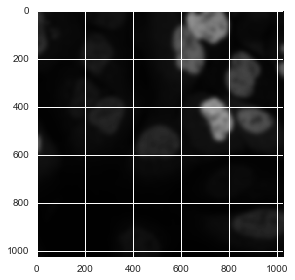

In [35]:
sio.imshow(gaussian_blur_cl1)

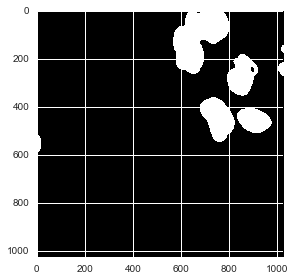

In [36]:
sio.imshow(segmented_zlevel)

### 2) Watershed segmentation to separate touching cells by using ``` cellseg.watershedsegment()```

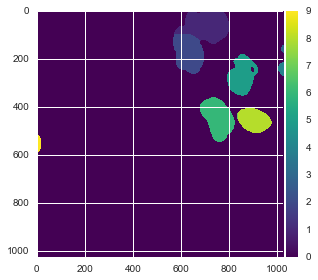

In [37]:
labeled = cellseg.watershedsegment(segmented_zlevel,smooth_distance = True,kernel = 31) ##increase kernel size if it is oversegmenting
sio.imshow(labeled)

### 3) Drawing contours with ``` cellseg.draw_contours()```


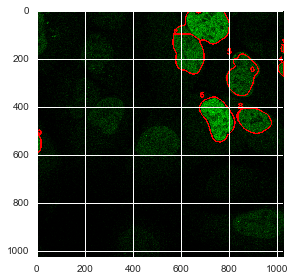

In [38]:
zlevel_image_color_regions  = cellseg.draw_contours(labeled,zlevel_image_color, with_labels = True, color = (255,0,0),width = 3 )
sio.imshow(zlevel_image_color_regions)
sio.imsave(path_results+'Z-level_Regions'+str(z)+'.tif',zlevel_image_color_regions)

### 4) Get measurements with  ``` cellseg.regions_measure()```
 


In [39]:
positions_regions = cellseg.regions_measure(labeled,zlevel_image)
positions_regions

,x_col,y_row,r,track_window,mean_inensity
0,699.670808,63.972839,332.933027,"(567, 0, 230, 141)",107.147774
1,627.786950,177.495646,258.045202,"(564, 100, 129, 165)",80.739234
2,1018.113208,160.396226,38.313708,"(1011, 145, 13, 32)",87.981132
3,1013.389658,242.845799,71.627417,"(1000, 215, 24, 59)",90.467221
4,849.501812,270.943371,279.149278,"(787, 182, 131, 173)",60.759997
5,748.994276,447.989182,267.320851,"(674, 361, 146, 186)",116.240570
6,831.184615,440.000000,23.207107,"(830, 427, 3, 27)",69.400000
7,899.827102,456.608517,201.287843,"(833, 407, 140, 104)",73.155207
8,7.040634,553.385530,79.263456,"(0, 518, 17, 71)",88.846383


## Detection of cells in one frame by using the blob detection algorithm in ```cellseg```
### 1) Testing parameters by drawing the blobs using the function ``` cellseg.draw_blob_log()```

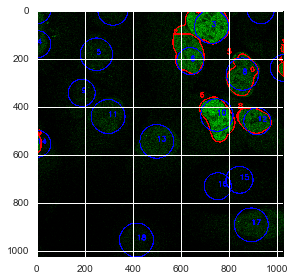

In [40]:
zlevel_image_color_marked =  cellseg.draw_blob_log(gaussian_blur_cl1,zlevel_image_color,  with_labels = True,max_sigma=50,  min_sigma=40,num_sigma=5,threshold=.01,overlap=0.4,color_blobs = (0,0,255),width =3)
sio.imshow(zlevel_image_color_marked)

### 2) Get measurements with the blob detection with the function ```cellseg.blob_log_measure()```

In [41]:
positions_blobs = cellseg.blob_log_measure(gaussian_blur_cl1,zlevel_image, max_sigma=50,  min_sigma=40,num_sigma=5,threshold=.01,overlap=0.4 )
positions_blobs.head()

,x_col,y_row,r,track_window,mean_intensity
0,0.0,0.0,56.568542,"(0, 0, 113, 113)",30.807784
1,314.0,0.0,63.639610,"(250, 0, 127, 127)",16.080922
2,927.0,0.0,56.568542,"(870, 0, 113, 113)",12.068889
3,723.0,68.0,70.710678,"(652, 0, 141, 141)",111.676591
4,0.0,141.0,56.568542,"(0, 84, 113, 113)",30.920868


# Cell Tracking of Video With Blob Detection by Using ```cellseg.cell_tracking``` class

1. Create cell_tracking object
2. Set segmentation parameters
3. Set blob parameters
4. Track with blob
5. Draw trajectories
6. Save the output as a video
7. Get measurements in a table


```ct = cellseg.cell_tracking(green,green,green_color)
ct.set_segment_param(enhance = False, blur = True, kernel = 61, n_intensities = 2)
ct.set_blob_param(max_sigma=50,min_sigma=40,num_sigma=5,threshold=.01,overlap=0.4)
ct.track_with_blob()
ct.draw_trajectories()
ct.create_video(path_results, 'Blob_Detection', fps = 2)
table_positions  = ct.positions_table
```

In [42]:
positions_table = pd.read_csv(path_results+image[:-4]+'_Positions_Table.csv', index_col = 0,converters={"track_window": ast.literal_eval})
positions_table.head()

,x_col,y_row,z,r,label,track_window,mean_intensity,median_intensity
0,0.0,0.0,0,56.568542,1,"(0, 0, 113, 113)",30.807784,28.0
1,314.0,0.0,0,63.639610,2,"(250, 0, 127, 127)",16.080922,14.0
3,723.0,68.0,0,70.710678,4,"(652, 0, 141, 141)",111.676591,114.0
5,246.0,183.0,0,67.175144,6,"(178, 115, 134, 134)",22.950330,21.0
6,635.0,211.0,0,56.568542,7,"(578, 154, 113, 113)",82.016049,83.0


In [43]:
video = io.open('images/tracking_example/Results/Blob_Detection_480.mov', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

# Track a Cell and Determine How the Intensity Changes with Time by Using ```ct.track_blob_labeled()```
1. Select the label
2. Track
3. Create video

```
label = 11
stack_graph = ct.track_blob_labeled(label)
cellseg.create_video(path_results, 'Tracked_blob_' + str(label),stack_graph)

```


In [44]:
video = io.open('images/tracking_example/Results/Tracked_blob_11_720.mov', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

# Cell Tracking With Tracking Window by Using ```ct.track_window()``` or ```track_window_graph()```

1. Create Object
2. Set Parameters
3. Track window and get measurements
4. Save video

``` 
track_window =  (680,370,137,175)

ct2 = cellseg.cell_tracking(green,green,green_color)
ct2.set_watershed_param(smooth_distance = True, kernel = 31)

#Track cells by returning a zstack with the marked cell and the intensity measurements
tracked_label, measurements = ct2.track_window(z,track_window,enhance_bool = True,kernel_size = 61)
stack_graph = ct2.track_window_graph(1,z,track_window,enhance_bool = True, blur_bool = True, kernel_size = 61)

#Save Zstack and video
sio.imsave(path_results+ 'Tracked_window.tif',stack_graph)
cellseg.create_video(path_results, 'Tracked_window',stack_graph)

```

In [45]:
video = io.open('images/tracking_example/Results/Tracked_window_720.mov', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

# Now Lets Explore Some Data

## CCDN1 degradation after different treatments

In [46]:
all_tables = pd.read_csv('images/tracking_example/Results/Summary_Results.csv',index_col = 0,converters={"track_window": ast.literal_eval})

In [47]:
all_tables.head()

,x_col,y_row,z,r,label,track_window,mean_intensity,median_intensity,image,group
0,522.0,62.0,0,56.568542,1,"(465, 5, 113, 113)",27.173184,27.0,GSK+MLN_1,GSK+MLN
1,362.0,109.0,0,67.175144,2,"(294, 41, 134, 134)",52.070845,53.0,GSK+MLN_1,GSK+MLN
2,733.0,188.0,0,56.568542,3,"(676, 131, 113, 113)",23.222550,23.0,GSK+MLN_1,GSK+MLN
3,627.0,343.0,0,56.568542,4,"(570, 286, 113, 113)",33.360386,34.0,GSK+MLN_1,GSK+MLN
4,424.0,374.0,0,56.568542,5,"(367, 317, 113, 113)",25.842357,25.0,GSK+MLN_1,GSK+MLN


In [48]:
print('These are the groups: ')
np.unique(all_tables.group)

These are the groups: 


array(['GSK', 'GSK+MLN', 'LMB', 'LMB+MLN', 'MLN', 'NT'], dtype=object)

In [49]:
print('These are the videos or zstack images: ')
np.unique(all_tables.image)

These are the videos or zstack images: 


array(['GSK+MLN_1', 'GSK+MLN_2', 'GSK+MLN_3', 'GSK+MLN_4', 'GSK+MLN_5',
       'GSK_1', 'GSK_2', 'GSK_3', 'GSK_4', 'GSK_5', 'LMB+MLN_1',
       'LMB+MLN_2', 'LMB+MLN_3', 'LMB+MLN_4', 'LMB+MLN_5', 'LMB_1',
       'LMB_2', 'LMB_3', 'LMB_4', 'LMB_5', 'MLN_1', 'MLN_2', 'MLN_3',
       'MLN_4', 'MLN_5', 'NT_1', 'NT_2', 'NT_3', 'NT_4'], dtype=object)

## Lets explore the results of one video with several cells

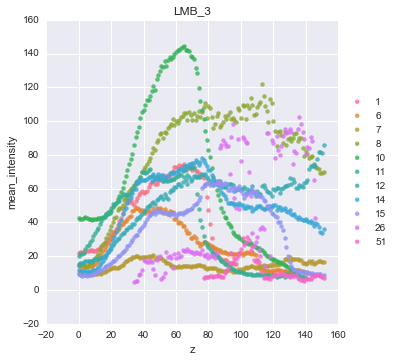

In [50]:
LMB_3 = all_tables[all_tables.image == 'LMB_3']
g = sns.lmplot(x="z", y="mean_intensity", hue="label", data=LMB_3,fit_reg = False, size=5, legend = False);
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('LMB_3')

## Lets look at the effects of the treatments

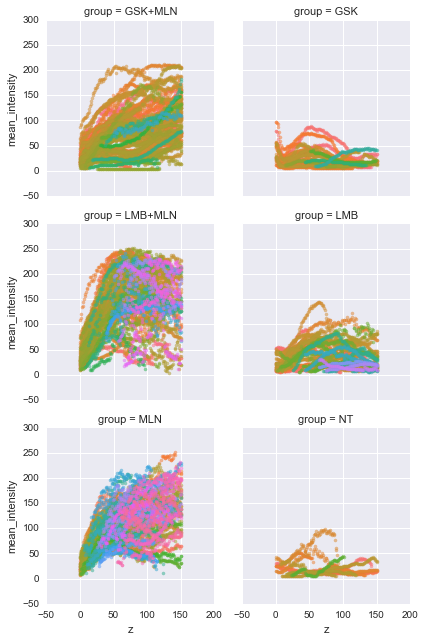

In [51]:
kws = dict(s=10)
g = sns.FacetGrid(all_tables, col="group",hue ='label',col_wrap=2)
g.map(plt.scatter, "z", "mean_intensity", alpha=0.5,**kws)

## Lets explore the results by video/image

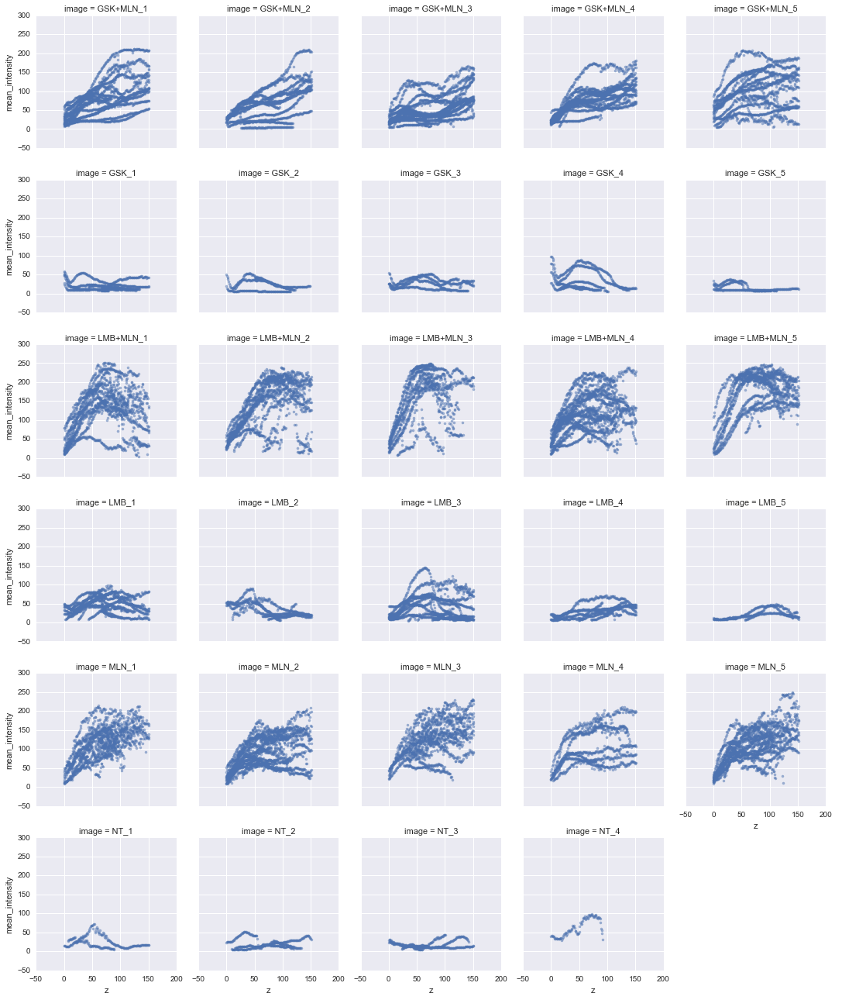

In [52]:
g = sns.FacetGrid(all_tables, col="image" , col_wrap=5)
g.map(plt.scatter, "z", "mean_intensity", alpha=0.5,**kws)
g.add_legend()

## I'm interested in looking at LMB_3 again

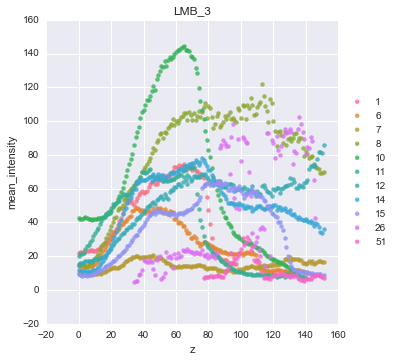

In [53]:
g = sns.lmplot(x="z", y="mean_intensity", hue="label", data=LMB_3,fit_reg = False, size=5, legend = False);
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('LMB_3')

## Lets look at cell 10

In [54]:
video = io.open('images/tracking_example/Results/LMB_3Label_10_720.mov', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

## Maybe we can do some modeling and determine several measurements

In [55]:
label=  LMB_3[LMB_3.label == 10]

[  40.50737991  139.19767782   35.46204653    6.37256099]


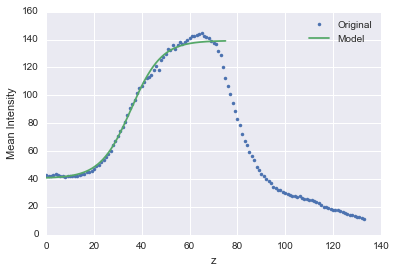

In [56]:
x = label['z'].values
y =label['mean_intensity'].values
from scipy.optimize import curve_fit

def sigmoid(x, bottom,top,constant,time_c):
     y = top+(bottom-top)/(1+ np.exp((x-constant)/time_c)) 
     return y

popt, pcov = curve_fit(sigmoid, x[0:75], y[0:75])
print popt
xp = np.linspace(0,75, 200)
y_model = sigmoid(xp, *popt)

plt.plot(x, y, '.', xp, y_model, '-')
plt.xlabel('z')
plt.ylabel('Mean Intensity')
plt.legend(['Original','Model'])

# Summary
### 1. Cell Segmentation is a module to track and measure mean intensity in cells
### 2. Can be used to determine if treatments affect the levels and rates of expression and degradation of a protein 
### 3. In the future, it can be used to tell if the protein moves from the nucleus to the cytoplasm
### 4. In the future, maybe cells can be classified